In [1]:

import cooler
import pandas as pd
import pybedtools as bt
import seaborn as sns
import networkx as nx

import numpy as np
import itertools

import matplotlib.pyplot as plt
import conorm
import time
from multiprocessing import Pool

from matplotlib import gridspec



from matplotlib_venn import venn2
from collections import Counter, deque
import pickle
import re
import os

from mycolorpy import colorlist as mcp
import matplotlib.patches as mpatches
import matplotlib.collections as mcol
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import gridspec
from scipy.stats import shapiro, mannwhitneyu


from adjustText import adjust_text

color1=mcp.gen_color(cmap="Reds",n=10)[-7:-2]
color2=mcp.gen_color(cmap="Greys",n=10)[-7:-2]


colorPalette = {
    "ANDR"    : color1[-1],
    "High"    : color2[-1],
    "Mid-high": color2[-2],
    "Mid-low" : color2[-3],
    "low"     : color2[-4],
    
    "ARcre"   : "#67B95D",
    "cre"     : "#014f86",
    "rnd"     : "#BBBBBB",
    "AR"      : "#999999"
}

MAPty = pickle.load(open('data/MAP/MAPty.p', 'rb'))
MAPcl = pickle.load(open('data/MAP/MAPcl.p', 'rb'))
MAPgn = pickle.load(open('data/MAP/MAPgn.p', 'rb'))

# Compare HiChIP

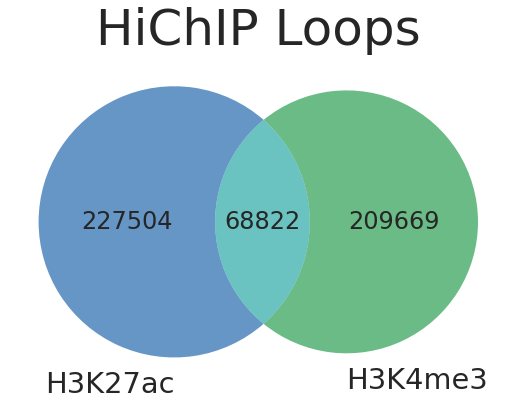

In [2]:
sns.set(style="ticks", font_scale=2)

H3K27ac = pd.read_table('data/BEDPE/H3K27ac_Loops.bedpe', names=['Chr1', 'Start1', 'End1','Chr2', 'Start2', 'End2', 'Name', 'PET', 'PADJ'])

H3K4me3 = pd.read_table('data/BEDPE/H3K4me3_Loops.bedpe', names=['Chr1', 'Start1', 'End1','Chr2', 'Start2', 'End2', 'Name', 'PET', 'PADJ'])


fig = plt.figure(figsize=[9,9])

venn2((set(H3K27ac.loc[H3K27ac['PADJ'] > 2, 'Name']), set(H3K4me3.loc[H3K4me3['PADJ'] > 2, 'Name'])), set_labels=('H3K27ac', 'H3K4me3'), set_colors=('#01509f' ,'#098e37'), alpha=0.6)
plt.title('HiChIP Loops', fontsize=50)


fig.savefig('plots/HiChIPvenn.pdf', bbox_inches ="tight",  pad_inches = 1 )

### Data for arc plots

In [3]:
!Rscript GI.R.edges.r -i <(cut -f1-7 data/BEDPE/H3K27ac_Loops.bedpe) -b data/BED/CRE.bed -o data/G/H3K27ac.edges.CRE.tsv
!Rscript GI.R.edges.r -i <(cut -f1-7 data/BEDPE/H3K4me3_Loops.bedpe) -b data/BED/CRE.bed -o data/G/H3K4me3.edges.CRE.tsv

No 'score' column found; setting counts to 1.
Warning message:
In file(resource) :
  using 'raw = TRUE' because '/dev/fd/63' is a fifo or pipe
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  44487
2    distal-cre 150934
3       cre-cre 100905
None
No 'score' column found; setting counts to 1.
Warning message:
In file(resource) :
  using 'raw = TRUE' because '/dev/fd/63' is a fifo or pipe
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  21301
2    distal-cre 158111
3       cre-cre  99079
None


In [4]:
GS = {}
for s in ['H3K27ac', 'H3K4me3']:

    interactions = f"data/G/{s}.edges.CRE.tsv"
    df = pd.read_table(interactions)

    GS[s] = nx.Graph()

    for i, row in df.iterrows():

        # >>> 1 >>>
        if row["cre.id1"].find("['") != -1:        
            s1 = row["cre.id1"].replace("['", "")
            s1 = s1.replace("']", "")
            s1 = s1.split("', '")
        else:
            s1 = [row["cre.id1"]]

        if row["cre.id2"].find("['") != -1:
            s2 = row["cre.id2"].replace("['", "")
            s2 = s2.replace("']", "")
            s2 = s2.split("', '")
        else:
            s2 = [row["cre.id2"]]

        # <<< 1 <<<

        # >>> 2 (3) >>>

        for s1_ in s1:
            for s2_ in s2:
                if s1_ == s2_:
                    continue
                nc1 = MAPty[s1_]
                GS[s].add_node(s1_, nodeClass=nc1)
                nc2 = MAPty[s2_]
                GS[s].add_node(s2_, nodeClass=nc2)
                
                GS[s].add_edge(s1_, s2_)



n = {}
for a, b in GS['H3K27ac'].edges:

    i = MAPty[a]
        
    j = MAPty[b]
    
    if (i, j) in n:
        n[(i,j)] +=1
    elif (j,i) in n:
        n[(j,i)] += 1
    else:
        n[(i,j)] = 1


p = [(k[0], k[1],100*v/sum(n.values()), 'H3K27ac') for k,v in n.items()]


n = {}
for a, b in GS['H3K4me3'].edges:
        
    i = MAPty[a]
        
    j = MAPty[b]
    
    if (i, j) in n:
        n[(i,j)] +=1
    elif (j,i) in n:
        n[(j,i)] += 1
    else:
        n[(i,j)] = 1


p += [(k[0], k[1],100*v/sum(n.values()), 'H3K4me3') for k,v in n.items()]
p

[('Enhancer', 'Enhancer', 43.205600173998505, 'H3K27ac'),
 ('Promoter', 'Enhancer', 40.355569160376675, 'H3K27ac'),
 ('Promoter', 'Promoter', 16.438830665624824, 'H3K27ac'),
 ('Enhancer', 'Enhancer', 12.1344333179835, 'H3K4me3'),
 ('Promoter', 'Promoter', 29.071283063930753, 'H3K4me3'),
 ('Promoter', 'Enhancer', 58.79428361808574, 'H3K4me3')]

# Contact Frequency of Reference loops

***PS: Please collect .cool files from GEO***


In [5]:
all_bedpe = pd.concat((H3K27ac, H3K4me3))

all_bedpe['Start1'] -= 499 # arbitrary number less than the resolution 5kb (to make sure indexing works)
all_bedpe['End1'] += 499
all_bedpe['Start2'] -= 499
all_bedpe['End2'] += 499

all_bedpe['Name'] = all_bedpe['Chr1'] + ':' + all_bedpe['Start1'].astype(str) +'-'+ all_bedpe['End1'].astype(str) +','+ all_bedpe['Chr2'] + ':' + all_bedpe['Start2'].astype(str) +'-'+ all_bedpe['End2'].astype(str)

all_bedpe

,Chr1,Start1,End1,Chr2,Start2,End2,Name,PET,PADJ
0,chr1,712000,713000,chr1,1167000,1168000,"chr1:712000-713000,chr1:1167000-1168000",11779,2.04154
1,chr1,712000,713000,chr1,742000,743000,"chr1:712000-713000,chr1:742000-743000",3319,10.69450
2,chr1,712000,713000,chr1,757000,758000,"chr1:712000-713000,chr1:757000-758000",3318,42.01160
3,chr1,712000,713000,chr1,792000,793000,"chr1:712000-713000,chr1:792000-793000",6322,24.29350
4,chr1,712000,713000,chr1,837000,838000,"chr1:712000-713000,chr1:837000-838000",11778,2.85275
...,...,...,...,...,...,...,...,...,...
278486,chrY,58987000,58988000,chrY,59017000,59018000,"chrY:58987000-58988000,chrY:59017000-59018000",277990,23.51260
278487,chrY,58997000,58998000,chrY,59002000,59003000,"chrY:58997000-58998000,chrY:59002000-59003000",277989,24.67720
278488,chrY,58997000,58998000,chrY,59032000,59033000,"chrY:58997000-58998000,chrY:59032000-59033000",277993,3.88449
278489,chrY,59002000,59003000,chrY,59017000,59018000,"chrY:59002000-59003000,chrY:59017000-59018000",277991,13.06090


In [6]:

# anhcor locations
anchor1 = set(a.split(",")[0] for a in all_bedpe["Name"])
anchor2 = set(a.split(",")[1] for a in all_bedpe["Name"])
tmp = pd.DataFrame({"Name": list(anchor1.union(anchor2))})
ancs = tmp["Name"].str.split(":|-", expand=True)
ancs["Name"] = tmp["Name"]
ancs = bt.BedTool.from_dataframe(ancs) 

# bin locations' indexes
C = cooler.Cooler("/groups/lackgrp/raw_data/LNCP/HiChIP/H3K27ac_0m.cool")
bins = C.bins()[:].copy()
bins = bins.reset_index()
bins = bt.BedTool.from_dataframe(bins[["chrom","start","end", "index"]]) 

# map anchors to bins 
maps = bt.BedTool.intersect(ancs, bins, wa=True, wb=True).to_dataframe(names=range(8)) # which loops correspond to which indexed bin.
cached = dict(zip(maps[3], maps[7]))


### Collect contact frequency of loops from cool files

In [7]:
# >>> H3K27ac >>>
print('H3K27ac Starting')

H3K27ac_matrix = {}
H3K27ac_C = {}


def takeSignal(ab):
    a, b = ab
    return H3K27ac_matrix[t][cached[a], cached[b]][0][0]


for t in ["0m","30m","4h", "16h","72h"]:
    print(t)
    # >>> 1 >>>
    H3K27ac_C[t] = cooler.Cooler(f"/groups/lackgrp/raw_data/LNCP/HiChIP/H3K27ac_{t}.cool")
    H3K27ac_matrix[t] = H3K27ac_C[t].matrix(balance=False)
    # <<< 1 <<<
    
    if t == '0m':
        # >>> 2 >>>
        bins = H3K27ac_C[t].bins()[:].copy()
        bins = bins.reset_index()
        bins = bt.BedTool.from_dataframe(bins[["chrom","start","end", "index"]])

        tmp = pd.DataFrame({"Name": list(set(a.split(",")[0] for a in all_bedpe["Name"]).union( set(a.split(",")[1] for a in all_bedpe["Name"])))})
        ancs = tmp["Name"].str.split(":|-", expand=True)
        ancs["Name"] = tmp["Name"]
        ancs = bt.BedTool.from_dataframe(ancs)

        maps = bt.BedTool.intersect(ancs, bins, wa=True, wb=True).to_dataframe(names=range(8))
        cached = dict(zip(maps[3], maps[7]))
        # <<< 2 <<<

    # >>> 3 >>>
    l = [(name.split(',')[0], name.split(',')[1]) for name in all_bedpe['Name'].tolist()]
    with Pool(20) as p:
        S = p.map(takeSignal, l)

    
    all_bedpe[t+'_H3K27ac'] = S
    # <<< 3 <<<
    print()
    
# <<< H3K27ac <<<



H3K27ac Starting
0m

30m

4h

16h

72h



In [8]:
# >>> H3K4me3 >>>
print('H3K4me3 Starting')

H3K4me3_matrix = {}
H3K4me3_C = {}


def takeSignal(ab):
    a, b = ab
    return H3K4me3_matrix[t][cached[a], cached[b]][0][0]


for t in ["0m","30m","4h", "16h","72h"]:
    print(t)
    # >>> 1 >>>
    H3K4me3_C[t] = cooler.Cooler(f"/groups/lackgrp/raw_data/LNCP/HiChIP/H3K4me3_{t}.cool")
    H3K4me3_matrix[t] = H3K4me3_C[t].matrix(balance=False)
    # <<< 1 <<<
    
    if t == 'Vh':
        # >>> 2 >>>
        bins = H3K4me3_C[t].bins()[:].copy()
        bins = bins.reset_index()
        bins = bt.BedTool.from_dataframe(bins[["chrom","start","end", "index"]])

        tmp = pd.DataFrame({"Name": list(set(a.split(",")[0] for a in all_bedpe["Name"]).union( set(a.split(",")[1] for a in all_bedpe["Name"])))})
        ancs = tmp["Name"].str.split(":|-", expand=True)
        ancs["Name"] = tmp["Name"]
        ancs = bt.BedTool.from_dataframe(ancs)

        maps = bt.BedTool.intersect(ancs, bins, wa=True, wb=True).to_dataframe(names=range(8))
        cached = dict(zip(maps[3], maps[7]))
        # <<< 2 <<<

    # >>> 3 >>>
    l = [(name.split(',')[0], name.split(',')[1]) for name in all_bedpe['Name'].tolist()]
    with Pool(20) as p:
        S = p.map(takeSignal, l)

    
    all_bedpe[t+'_H3K4me3'] = S
    # <<< 3 <<<
    print()
    
# <<< H3K4me3 <<<



H3K4me3 Starting
0m

30m

4h

16h

72h



### Run TMM normalization along time axis

In [9]:

A = np.nan_to_num(all_bedpe[["0m_H3K27ac", "30m_H3K27ac","4h_H3K27ac","16h_H3K27ac", "72h_H3K27ac"]].values)

R = 1 /(conorm.tmm_norm_factors(A) * A.sum(0) / 1000000)

N = A * R

for i, t in enumerate(["0m","30m","4h", "16h","72h"]):
    all_bedpe[t+"_H3K27ac.tmm"] = N[:,i]
    all_bedpe[["Chr1","Start1", "End1", "Chr2","Start2","End2", "Name", t+"_H3K27ac.tmm"]].to_csv(f"data/BEDPE/H3K27ac_{t}_tmm.bedpe",sep="\t", index=False , header=False)
  

In [12]:

A = np.nan_to_num(all_bedpe[["0m_H3K4me3", "30m_H3K4me3","4h_H3K4me3","16h_H3K4me3", "72h_H3K4me3"]].values)

R = 1 /(conorm.tmm_norm_factors(A) * A.sum(0) / 1000000)

N = A * R

for i, t in enumerate(["0m","30m","4h", "16h","72h"]):
    all_bedpe[t+".tmm_H3K4me3"] = N[:,i]
    all_bedpe[["Chr1","Start1", "End1", "Chr2","Start2","End2", "Name", t+".tmm_H3K4me3"]].to_csv(f"data/BEDPE/H3K4me3_{t}_tmm.bedpe",sep="\t", index=False , header=False)

# Plotting contact matrices 

In [13]:

def plotRegion(region, gene, promoter, ticks=None, enhancers=None ,vmax=100):

    fig = plt.figure(figsize=[25,10], dpi=300)

    gs = gridspec.GridSpec(nrows=2, ncols=5, wspace=0.2, hspace=0.2, top=0.8)
    for i, t in enumerate(["0m","30m","4h", "16h","72h"]):
        data = H3K27ac_C[t].matrix(balance=False).fetch(region)
        m = H3K27ac_C[t].matrix(balance=False).fetch(region)
        m = m / m.sum()
        print(m.max())
        ax = fig.add_subplot(gs[0,i])
        im = ax.matshow(
            m, cmap='Blues', vmax=vmax
        )
        if ticks is not None:
            plt.xticks([(i*10**6 - region[1]) / 5000 for i in  ticks], ticks, fontsize=15)
            plt.yticks([(i*10**6 - region[1]) / 5000 for i in  ticks], ticks, fontsize=15)

        ax.grid(color='#888888', linestyle='--', linewidth=0.5)
        
        p = (promoter - region[1]) / 5000
        
        plt.scatter([p], [p], alpha=0.5, c='#FFFFFF')
        
        if enhancers is not None:
            e = [(e - region[1]) / 5000 for e in enhancers] 
        
            plt.scatter([e], [e], alpha=0.5, c='#e32f27')
        
        if i == 0:
            plt.ylabel('H3K27ac', fontsize=30)
            
    
    for i, t in enumerate(["0m","30m","4h", "16h","72h"]):
        m = H3K4me3_C[t].matrix(balance=False).fetch(region)
        m = m / m.sum()
        print(m.max())
        ax = fig.add_subplot(gs[1,i])
        im = ax.matshow(
            m, cmap='Greens', vmax=vmax
        )
        
        if ticks is not None:
            plt.xticks([(i*10**6 - region[1]) / 5000 for i in  ticks], ticks, fontsize=15)
            plt.yticks([(i*10**6 - region[1]) / 5000 for i in  ticks], ticks, fontsize=15)

        ax.grid(color='#888888', linestyle='--', linewidth=0.5)
        
        p = (promoter - region[1]) / 5000
        
        plt.scatter([p], [p], alpha=0.5, c='#FFFFFF')
        
        
        if enhancers is not None:
            e = [(e - region[1]) / 5000 for e in enhancers] 
        
            plt.scatter([e], [e], alpha=0.5, c='#e32f27')

        if i == 0:
            plt.ylabel('H3K4me3', fontsize=30)

        plt.xlabel(t, fontsize=30)
        
    
    fig.suptitle(gene, fontsize=100)
    

### KLK3

0.011271261698203429
0.011614314265243788
0.012284293653114946
0.021315727422777646
0.015176543464794549
0.007304044478360406
0.012112403100775194
0.013511766227049393
0.013483364050829373
0.006345733041575492


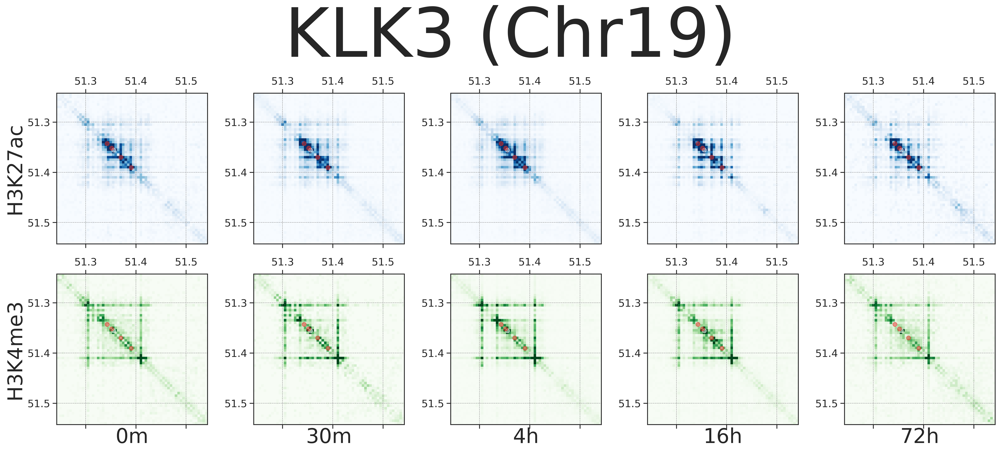

In [14]:
plotRegion(
	region=('chr19',51245000,51545000), 
	gene='KLK3 (Chr19)',
	promoter=51355671, 
	ticks=[51.3,51.4,51.5], 
	enhancers=(51342895, 51352016, 51370076, 51390631), 
	vmax=0.005)

### RPL36A

0.01605929586164299
0.020813320525136087
0.02046438410074774
0.046102661596958174
0.032955159373311727
0.028733130169786677
0.034782608695652174
0.032885359397271434
0.022954545454545453
0.0231990231990232


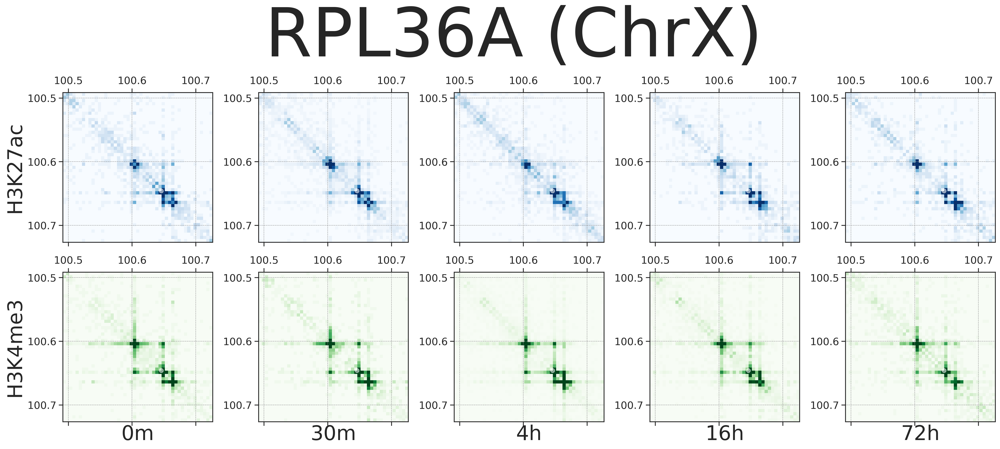

In [15]:

plotRegion(
	region=('chrX',100493955,100722622), 
	gene='RPL36A (ChrX)', 
	promoter=100645948, 
	ticks=[100.5, 100.6, 100.7], 
	vmax=0.01)

# Graph construction

In [18]:

!Rscript GI.R.edges.r -i data/BEDPE/H3K27ac_0m_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K27ac_0m.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K27ac_30m_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K27ac_30m.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K27ac_4h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K27ac_4h.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K27ac_16h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K27ac_16h.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K27ac_72h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K27ac_72h.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K4me3_0m_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K4me3_0m.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K4me3_30m_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K4me3_30m.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K4me3_4h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K4me3_4h.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K4me3_16h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K4me3_16h.tsv
!Rscript GI.R.edges.r -i data/BEDPE/H3K4me3_72h_tmm.bedpe -b data/BED/CRE.bed -o data/G/H3K4me3_72h.tsv


Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may represent other data
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  47424
2    distal-cre 287798
3       cre-cre 239595
None
Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may represent other data
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  47424
2    distal-cre 287798
3       cre-cre 239595
None
Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may re

In [19]:
DFs = pd.DataFrame()
first = True
for s in ['H3K27ac', 'H3K4me3']:
    for t in ["0m","30m","4h", "16h","72h"]:
        print(t)
        
        interactions = f"data/G/{s}_{t}.tsv"
        df = pd.read_table(interactions)
        df = df.rename(columns={'counts': f'{s}.{t}'})
        
        if first:
            DFs = df
            first = False
        else:
            DFs[f'{s}.{t}'] = df[f'{s}.{t}']
            
            
            

G = nx.Graph()

for i, row in DFs.iterrows():

    # >>> 1 >>>
    if row["cre.id1"].find("['") != -1:        
        s1 = row["cre.id1"].replace("['", "")
        s1 = s1.replace("']", "")
        s1 = s1.split("', '")
    else:
        s1 = [row["cre.id1"]]

    if row["cre.id2"].find("['") != -1:
        s2 = row["cre.id2"].replace("['", "")
        s2 = s2.replace("']", "")
        s2 = s2.split("', '")
    else:
        s2 = [row["cre.id2"]]

    # <<< 1 <<<
    
    # >>> 2 (3) >>>
    c = {}
    for w in ['H3K27ac.0m', 'H3K27ac.30m', 'H3K27ac.4h', 'H3K27ac.16h', 'H3K27ac.72h', 'H3K4me3.0m', 'H3K4me3.30m', 'H3K4me3.4h', 'H3K4me3.16h', 'H3K4me3.72h']:
        c[w] = row[w]

    for s1_ in s1:
        for s2_ in s2:
            

            nc1 = MAPcl[s1_]
            nc2 = MAPcl[s2_]
            G.add_node(s1_, nodeClass=nc1,color=colorPalette[nc1])
            G.add_node(s2_, nodeClass=nc2,color=colorPalette[nc2])
            
            if s1_ == s2_:
                continue
            G.add_edge(s1_, s2_, **c,)
            
    # <<< 2 (3) <<<
# <<< 2 <<<

pickle.dump(G, open('data/G/G_ALL.p', 'wb'))

0m


30m
4h
16h
72h
0m
30m
4h
16h
72h


/tmp/ipykernel_118693/10805193.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[20,20])


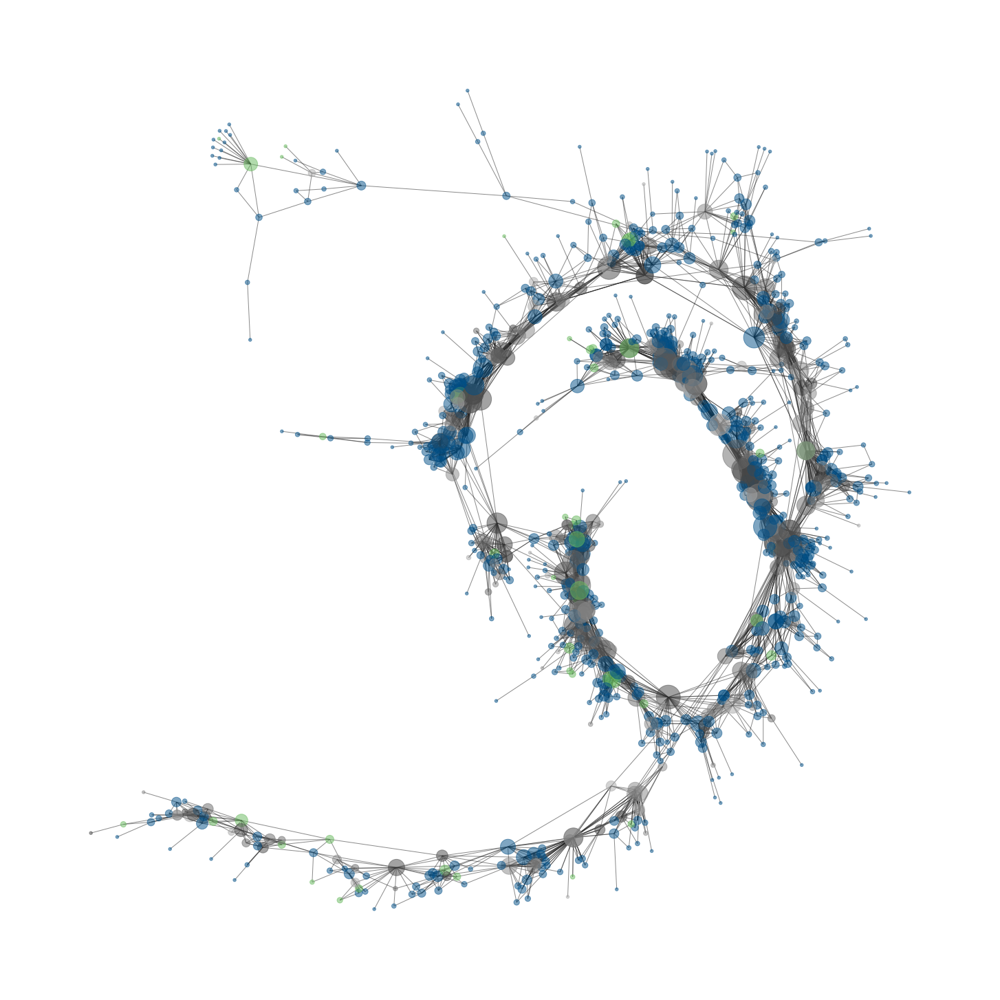

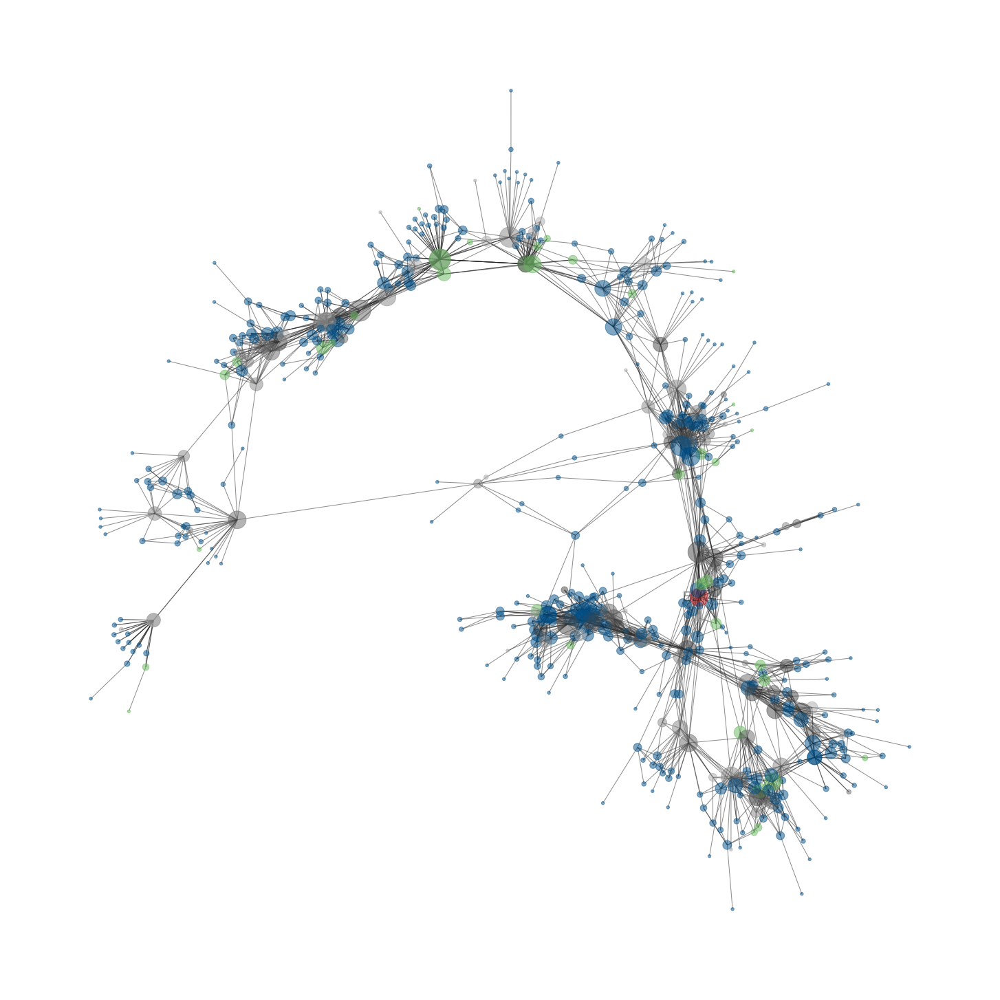

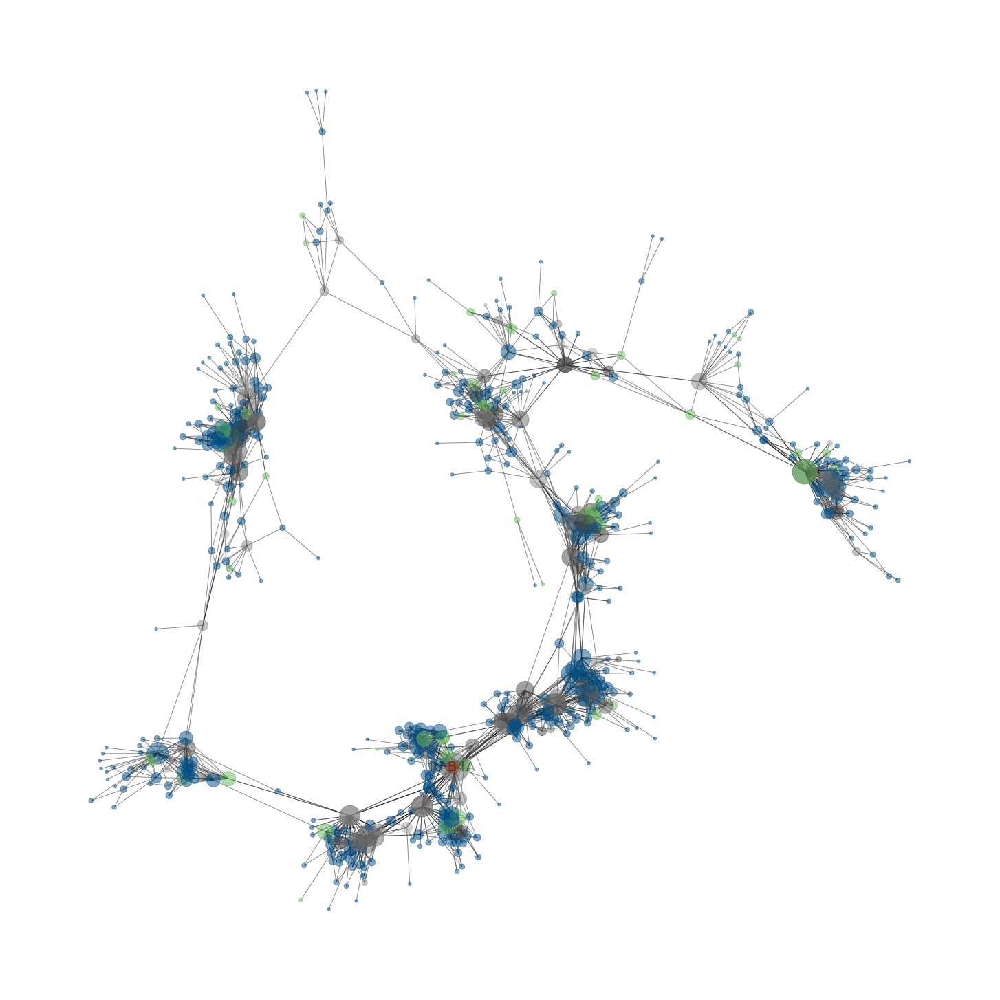

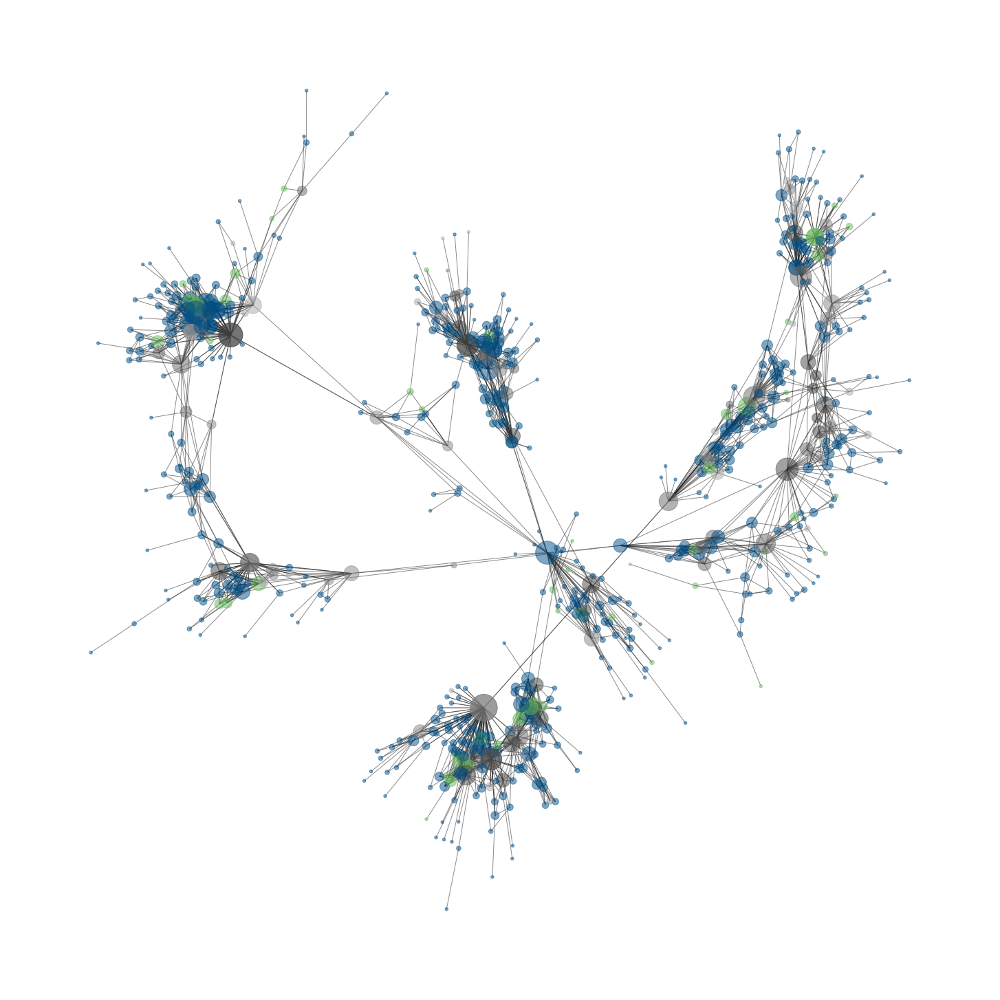

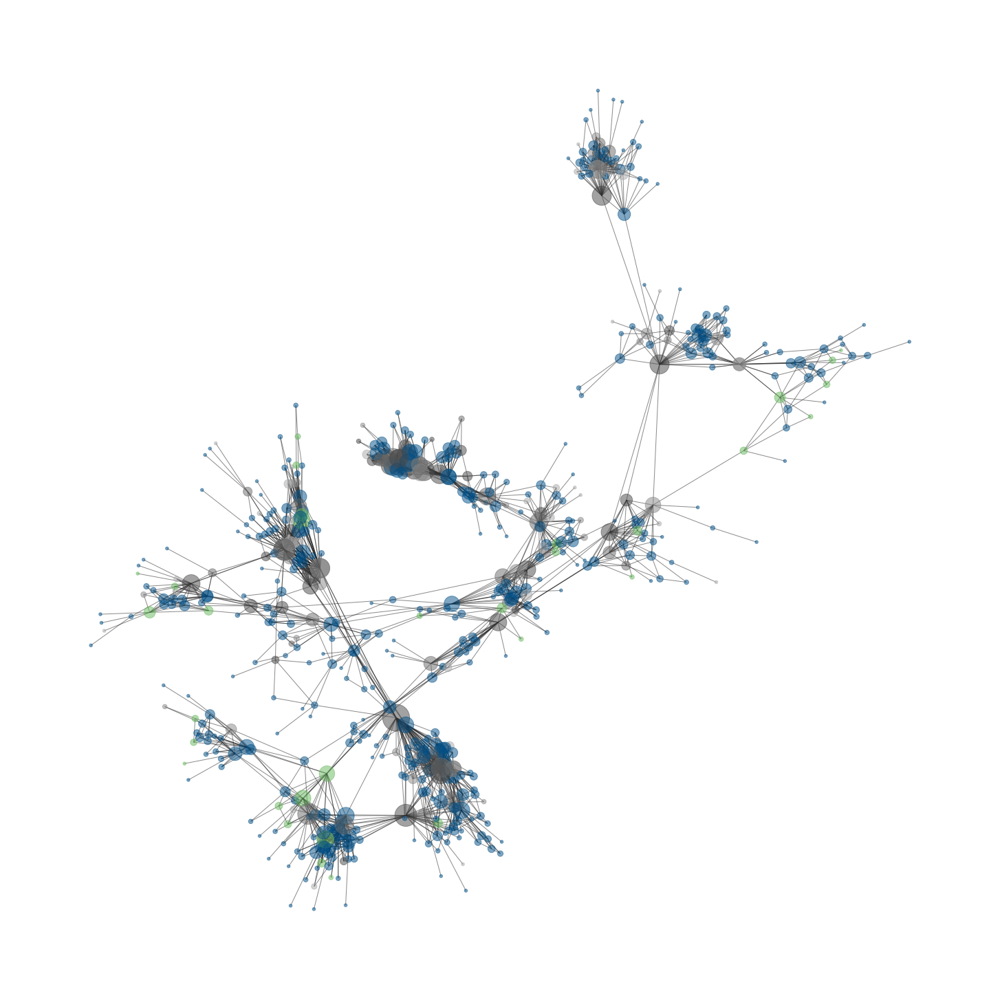

...

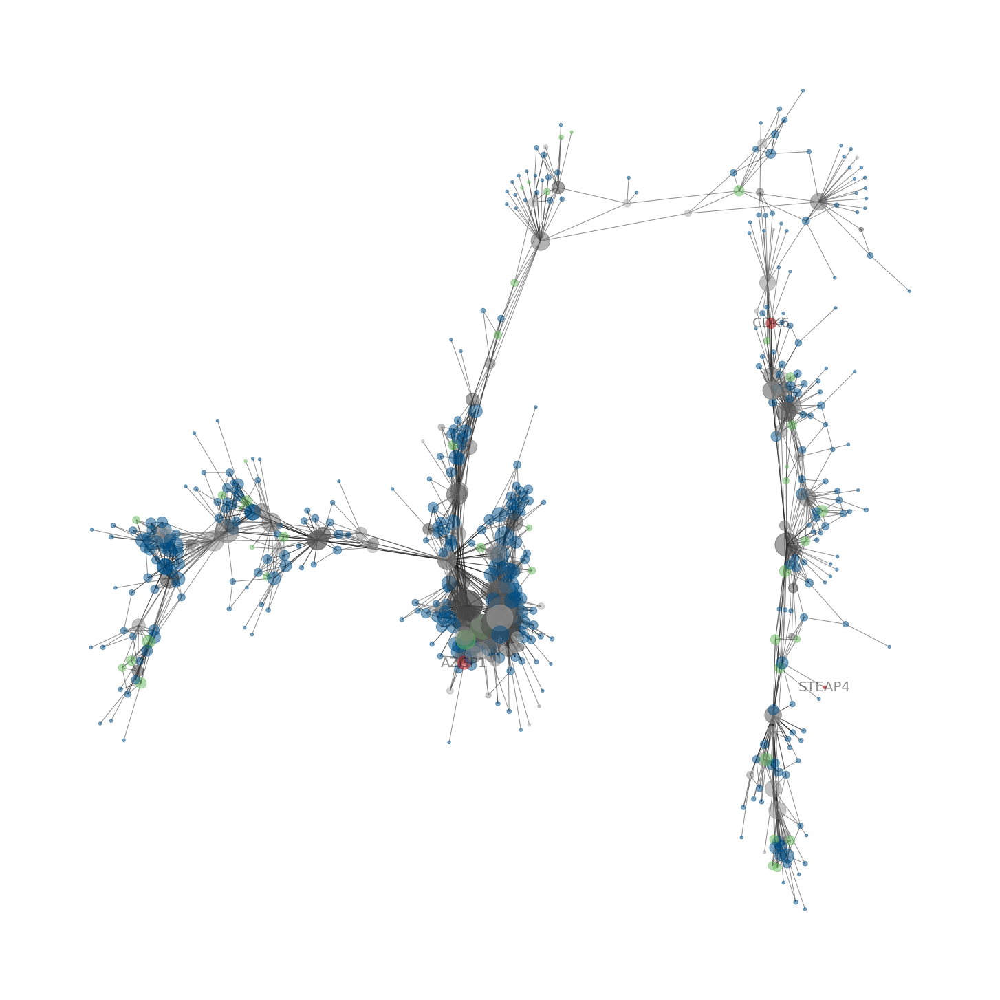

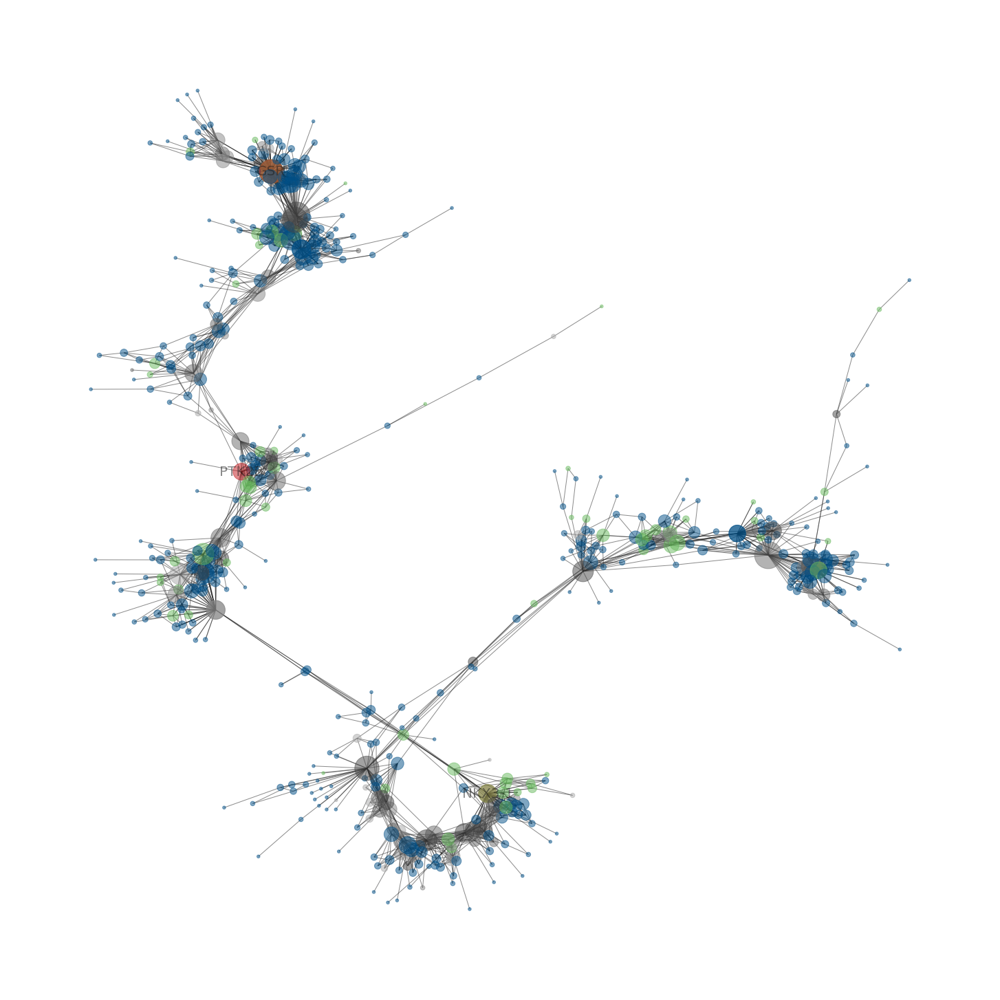

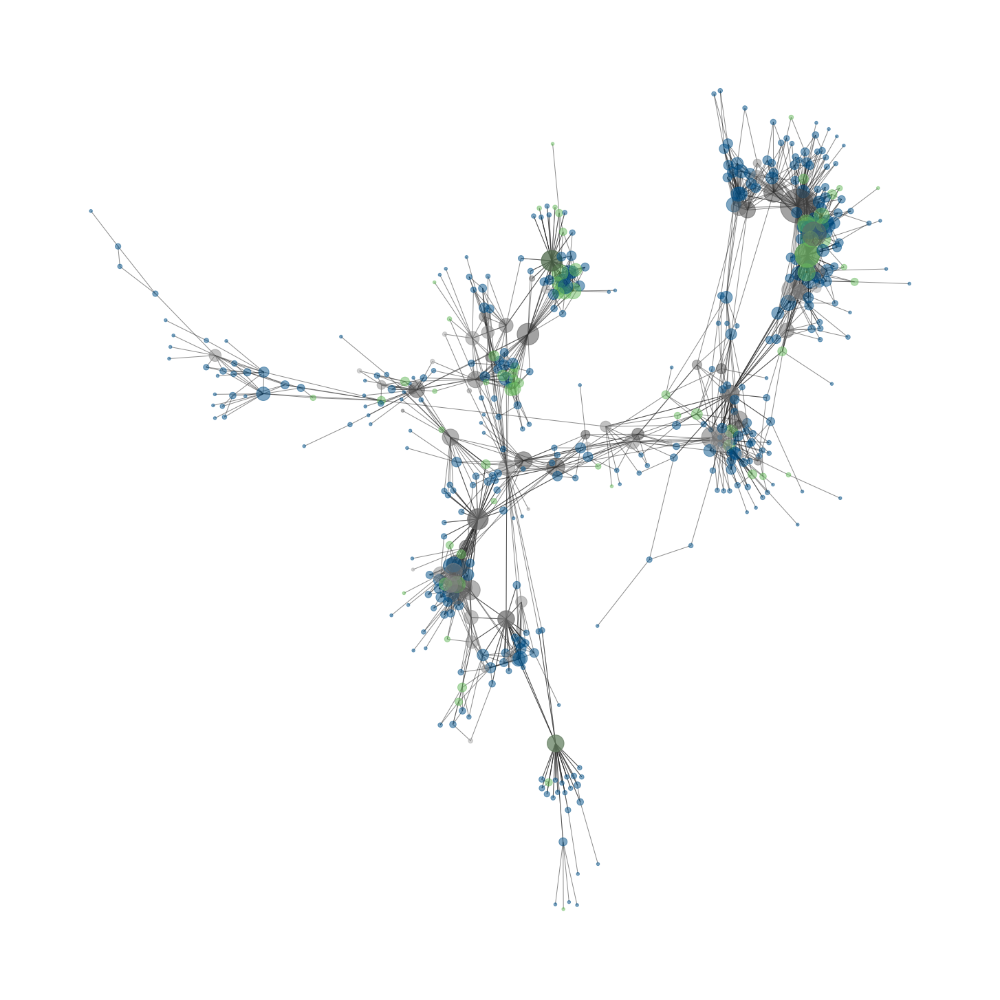

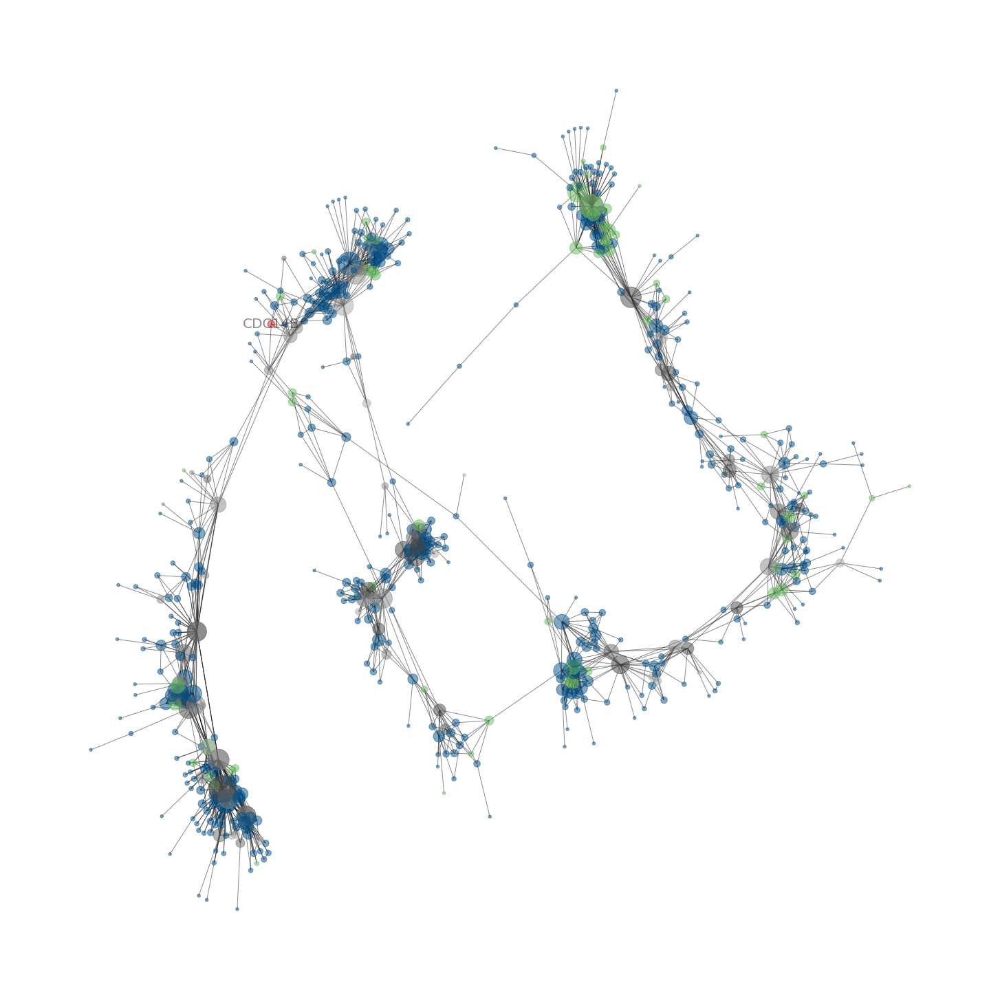

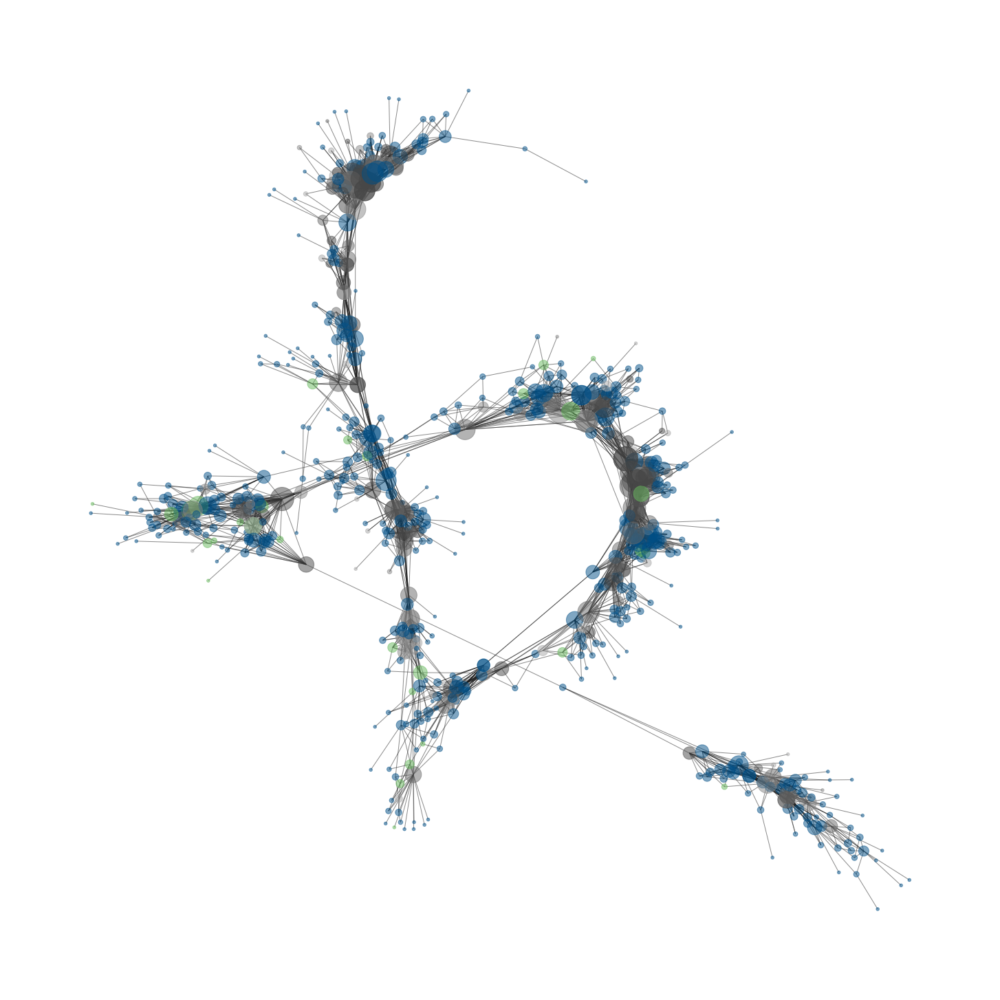

In [20]:
gs = [G.subgraph(g) for g in list(nx.connected_components(G))]

for i, g in enumerate(gs):

    if len(g.nodes) < 500:
        continue

    if i == 11:
        break

    plt.figure(figsize=[20,20])

    labels={n:MAPgn[n] for n in g if MAPcl[n] == 'ANDR'}

    nx.draw(g,
            node_color=dict(g.nodes(data='color')).values(), 
            node_size=20*np.array(list(dict(g.degree()).values()))**1.1,
            alpha=0.5,
            labels=labels, font_size=20
    )



# Circle Plots